# Simple code
First make sure that you install requirements:

`!pip install -r requirements.txt`

In [24]:
import os
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import numpy as np
from torchvision import transforms, datasets
import matplotlib.pyplot as plt
%matplotlib inline
plt.rcParams['figure.figsize'] = (10, 3) # set default size of plots

data_dir = os.path.join(os.path.expanduser('~'),'Documents','Data')
save_dir = os.path.join(os.path.expanduser('~'),'Documents','Data','Simulations')
device = 'cpu'

In [4]:
# MNIST Dataset
original_train_dataset = datasets.MNIST(root=data_dir, train=True, transform=transforms.ToTensor(), download=True)
original_test_dataset = datasets.MNIST(root=data_dir, train=False, transform=transforms.ToTensor(), download=True)

# Normalize the data
tensor_train = original_train_dataset.data.float()/255
tensor_test = original_test_dataset.data.float()/255

# Pair it with labels
data_train = torch.utils.data.TensorDataset(tensor_train, original_train_dataset.targets)
data_test = torch.utils.data.TensorDataset(tensor_test, original_test_dataset.targets)


# Data Loader (Input Pipeline)
loader_train = torch.utils.data.DataLoader(dataset=data_train, batch_size=100, shuffle=True)
loader_test = torch.utils.data.DataLoader(dataset=data_test, batch_size=100, shuffle=False)

In [13]:
# [CHANGED] Add dropout layer to introduce diversity in gradients
# [CHANGED] [Important] Use LeakyReLU since it keeps gradients better
discriminator = nn.Sequential(
    nn.Dropout(),
    nn.Linear(784, 256),
    nn.LeakyReLU(0.2),
    nn.Linear(256, 128),
    nn.LeakyReLU(0.2),
    nn.Linear(128, 64),
    nn.Dropout(),
    nn.LeakyReLU(0.2),
    nn.Linear(64, 1),
    nn.Sigmoid()
)
discriminator.to(device)

Sequential(
  (0): Dropout(p=0.5, inplace=False)
  (1): Linear(in_features=784, out_features=256, bias=True)
  (2): LeakyReLU(negative_slope=0.2)
  (3): Linear(in_features=256, out_features=128, bias=True)
  (4): LeakyReLU(negative_slope=0.2)
  (5): Linear(in_features=128, out_features=64, bias=True)
  (6): Dropout(p=0.5, inplace=False)
  (7): LeakyReLU(negative_slope=0.2)
  (8): Linear(in_features=64, out_features=1, bias=True)
  (9): Sigmoid()
)

In [15]:
# [CHANGED] [Important] Use LeakyReLU since it keeps noise better
generator = nn.Sequential(
    nn.Linear(128, 128),
    nn.LeakyReLU(0.2),
    nn.Linear(128, 256),
    nn.LeakyReLU(0.2),
    nn.Linear(256, 512),
    nn.LeakyReLU(0.2),
    nn.Linear(512, 784),
    nn.Sigmoid()
)
generator.to(device)

Sequential(
  (0): Linear(in_features=128, out_features=128, bias=True)
  (1): LeakyReLU(negative_slope=0.2)
  (2): Linear(in_features=128, out_features=256, bias=True)
  (3): LeakyReLU(negative_slope=0.2)
  (4): Linear(in_features=256, out_features=512, bias=True)
  (5): LeakyReLU(negative_slope=0.2)
  (6): Linear(in_features=512, out_features=784, bias=True)
  (7): Sigmoid()
)

In [18]:
LEARNING_RATE_D = 0.0002
LEARNING_RATE_G = 0.0002

opt_D = optim.Adam(discriminator.parameters(), lr=LEARNING_RATE_D)
opt_G = optim.Adam(generator.parameters(), lr=LEARNING_RATE_G)

In [19]:
N_EPOCH = 100

In [20]:
r1 = -1
r2 = 1

epoch: 0 	 last batch loss D: 0.006952543277293444 	 last batch loss G: 7.870769500732422


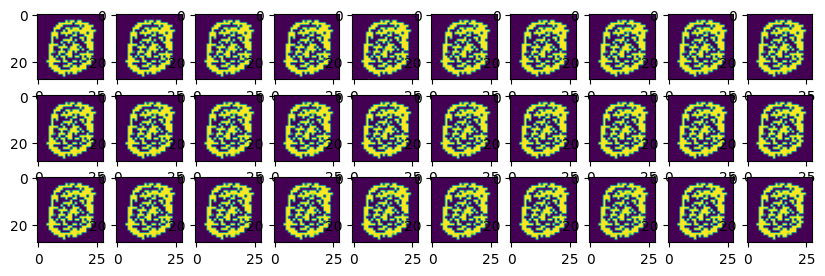

epoch: 1 	 last batch loss D: 0.03214326128363609 	 last batch loss G: 8.85888957977295


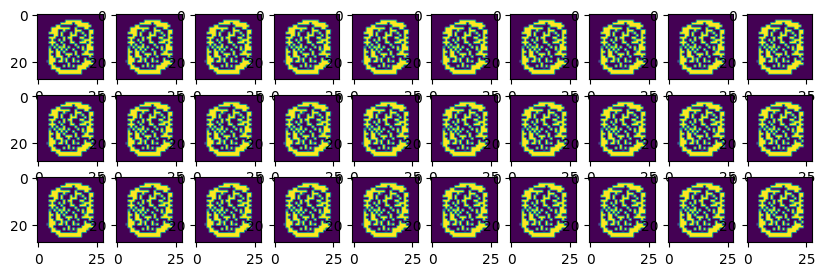

epoch: 2 	 last batch loss D: 0.017893901094794273 	 last batch loss G: 9.065451622009277


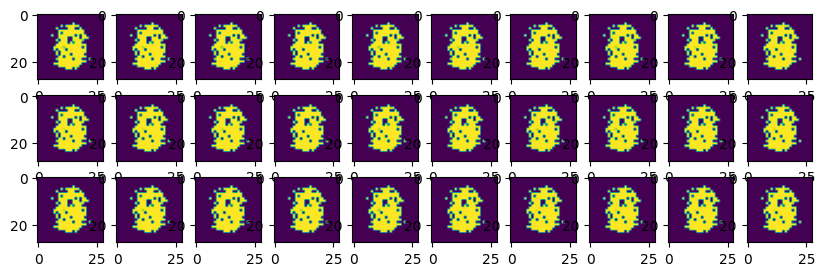

epoch: 3 	 last batch loss D: 0.24014347791671753 	 last batch loss G: 6.196927547454834


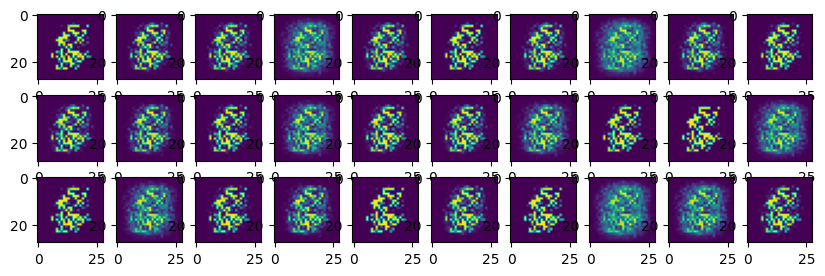

epoch: 4 	 last batch loss D: 0.35232433676719666 	 last batch loss G: 3.7721662521362305


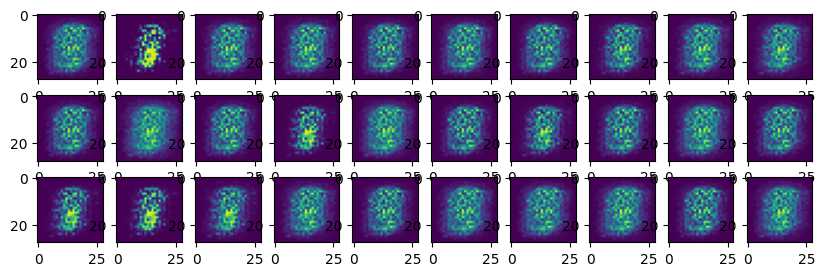

epoch: 5 	 last batch loss D: 0.4369485378265381 	 last batch loss G: 3.80322265625


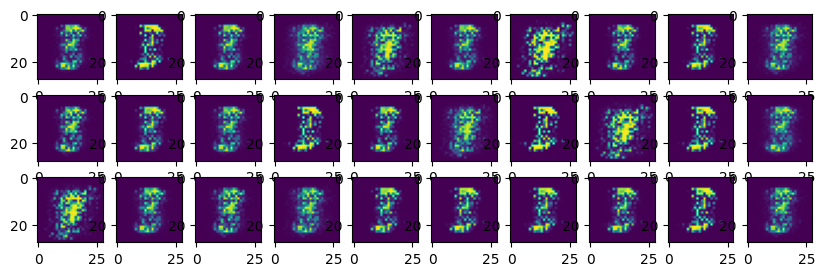

epoch: 6 	 last batch loss D: 0.2563468813896179 	 last batch loss G: 3.893874168395996


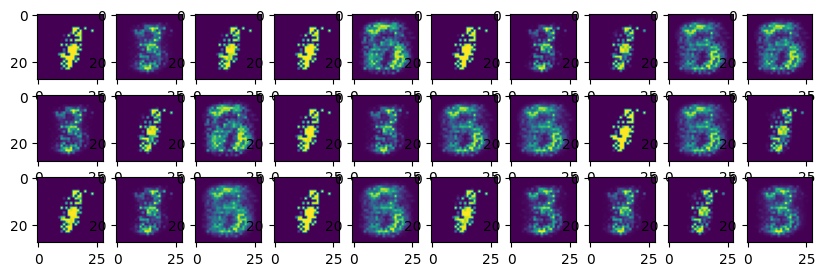

epoch: 7 	 last batch loss D: 0.2884445786476135 	 last batch loss G: 5.069352626800537


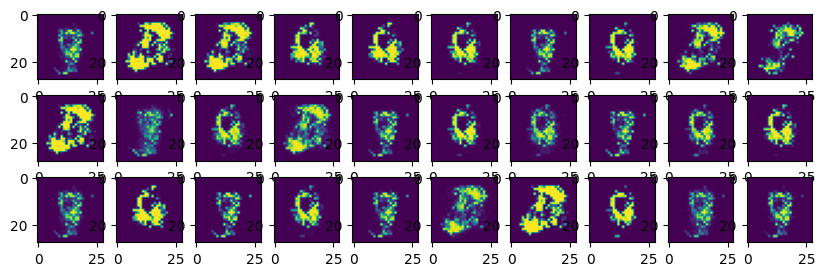

epoch: 8 	 last batch loss D: 0.44743281602859497 	 last batch loss G: 3.2990660667419434


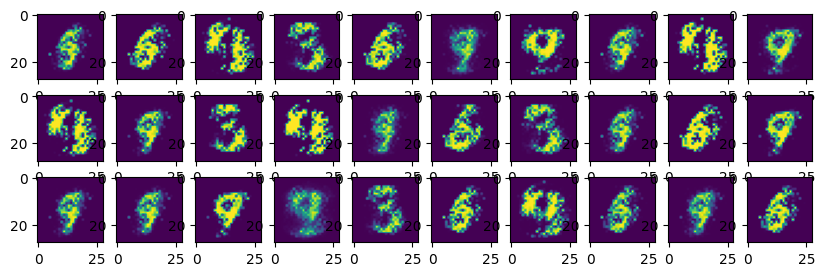

epoch: 9 	 last batch loss D: 0.2747180759906769 	 last batch loss G: 3.634267807006836


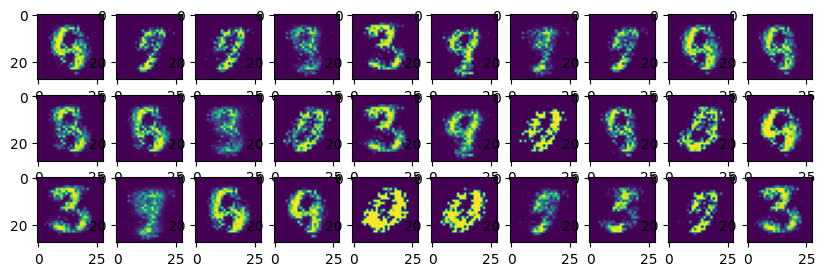

epoch: 10 	 last batch loss D: 0.3458879888057709 	 last batch loss G: 3.6365299224853516


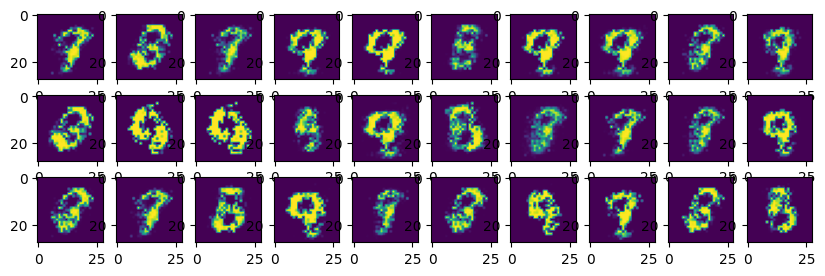

epoch: 11 	 last batch loss D: 0.2818031311035156 	 last batch loss G: 3.6628427505493164


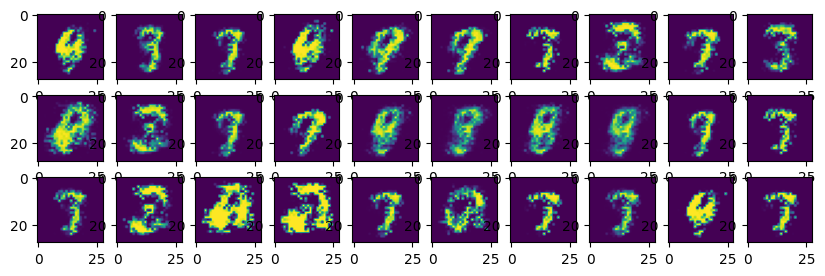

epoch: 12 	 last batch loss D: 0.3200967609882355 	 last batch loss G: 4.41351318359375


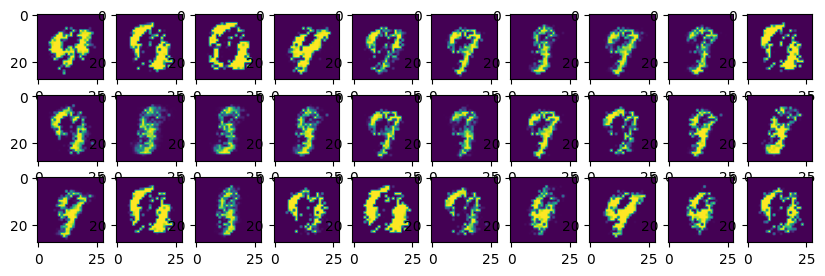

epoch: 13 	 last batch loss D: 0.4130506217479706 	 last batch loss G: 3.8895320892333984


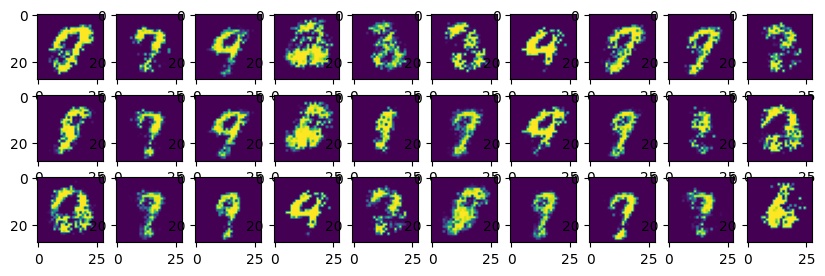

epoch: 14 	 last batch loss D: 0.2128283679485321 	 last batch loss G: 3.992386817932129


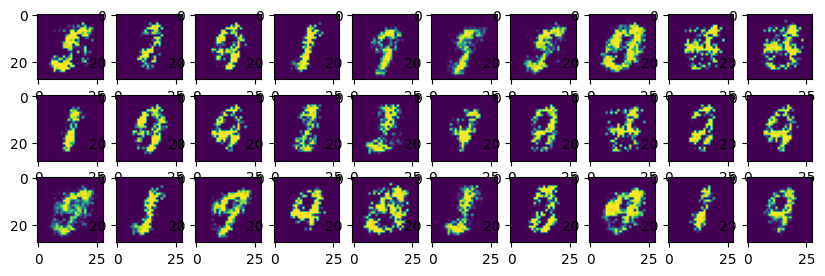

epoch: 15 	 last batch loss D: 0.36552560329437256 	 last batch loss G: 3.167513132095337


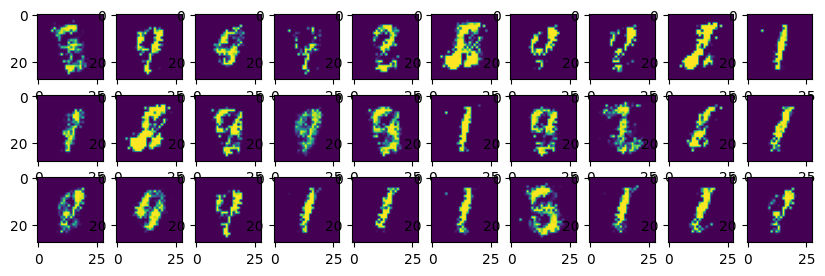

epoch: 16 	 last batch loss D: 0.3695700168609619 	 last batch loss G: 3.446390151977539


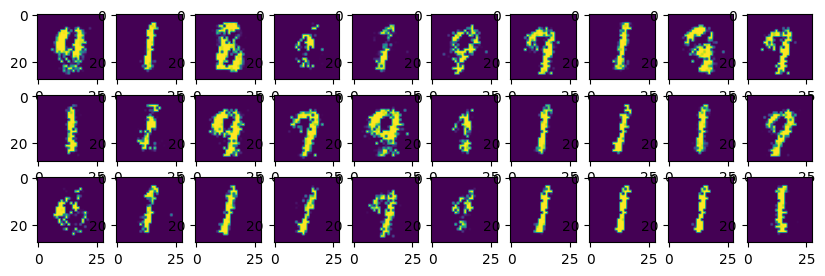

epoch: 17 	 last batch loss D: 0.3051263988018036 	 last batch loss G: 3.0518152713775635


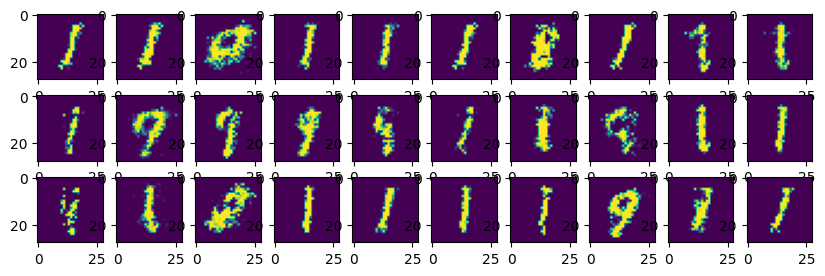

epoch: 18 	 last batch loss D: 0.30194711685180664 	 last batch loss G: 2.611083745956421


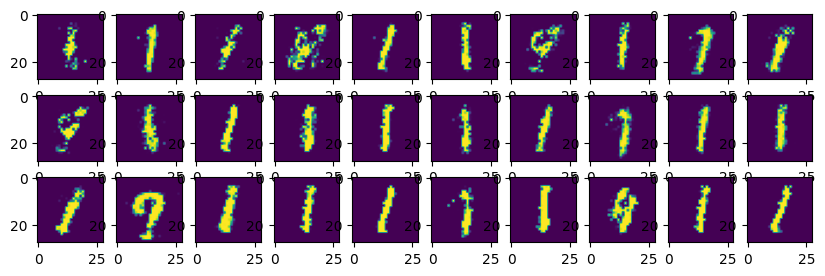

epoch: 19 	 last batch loss D: 0.36565449833869934 	 last batch loss G: 3.0415191650390625


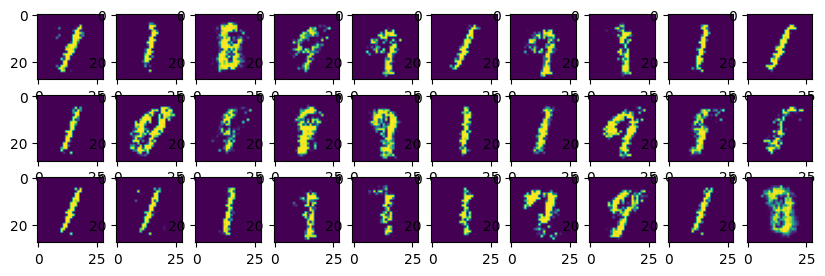

epoch: 20 	 last batch loss D: 0.4511678218841553 	 last batch loss G: 2.9207825660705566


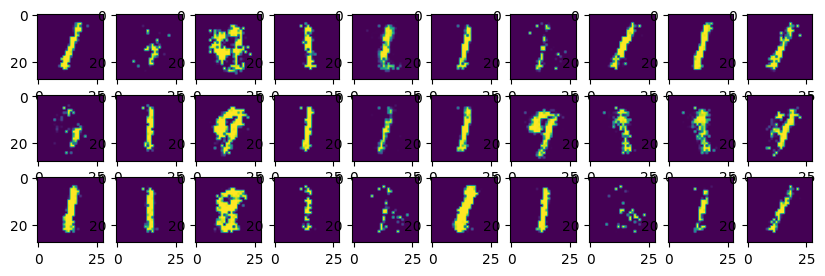

epoch: 21 	 last batch loss D: 0.613347053527832 	 last batch loss G: 2.2655482292175293


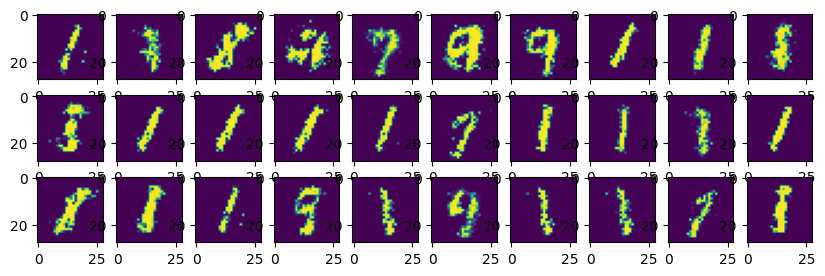

epoch: 22 	 last batch loss D: 0.5314288139343262 	 last batch loss G: 2.9637367725372314


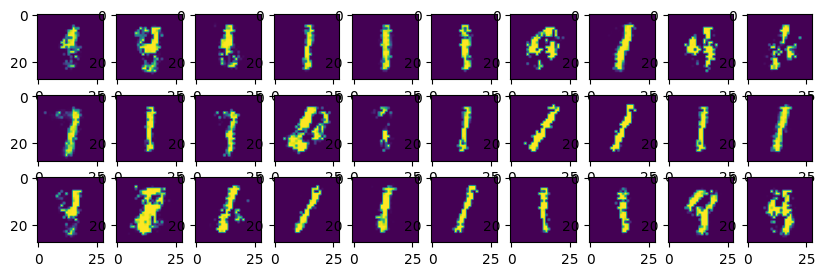

epoch: 23 	 last batch loss D: 0.4400686025619507 	 last batch loss G: 2.7905139923095703


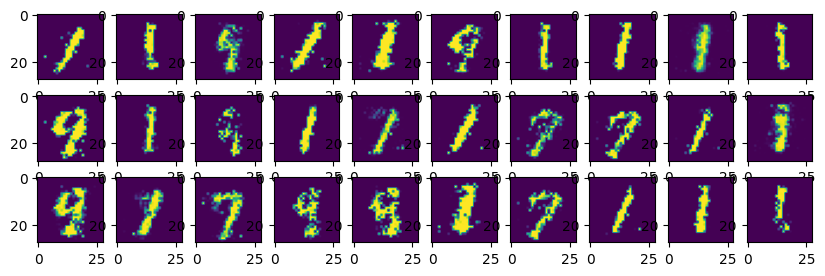

epoch: 24 	 last batch loss D: 0.4989530146121979 	 last batch loss G: 2.8170783519744873


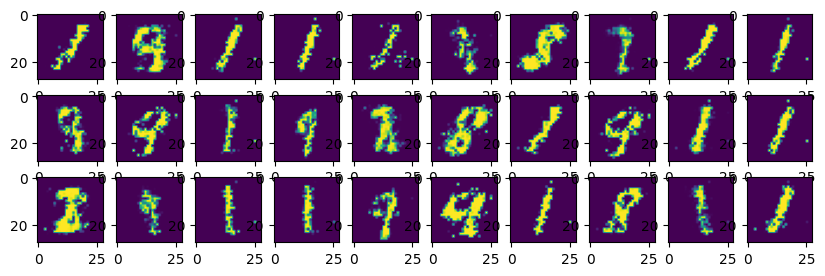

epoch: 25 	 last batch loss D: 0.6103531122207642 	 last batch loss G: 2.0921781063079834


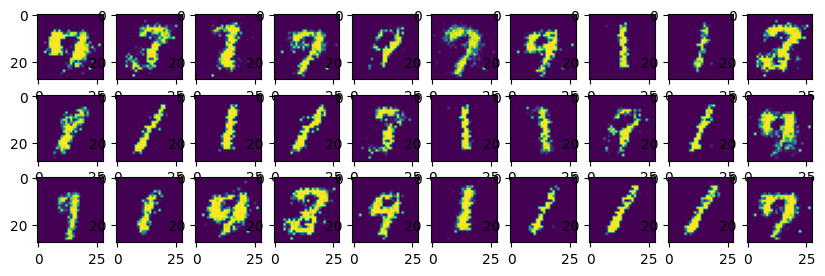

epoch: 26 	 last batch loss D: 0.6947036981582642 	 last batch loss G: 2.1495563983917236


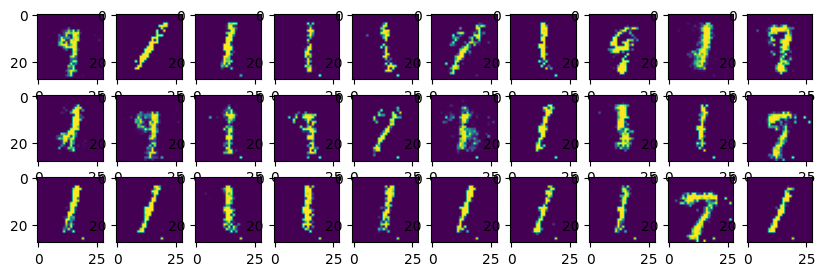

epoch: 27 	 last batch loss D: 0.5897825956344604 	 last batch loss G: 2.362752914428711


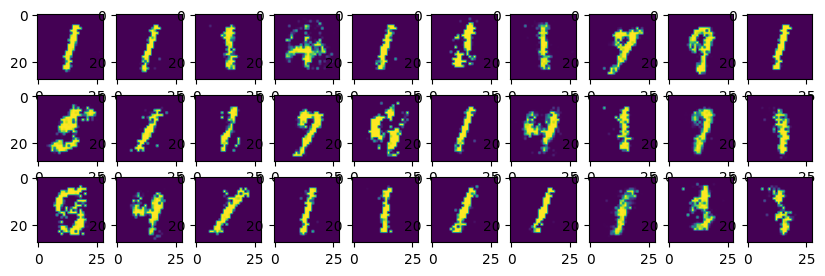

epoch: 28 	 last batch loss D: 0.6117055416107178 	 last batch loss G: 2.3379604816436768


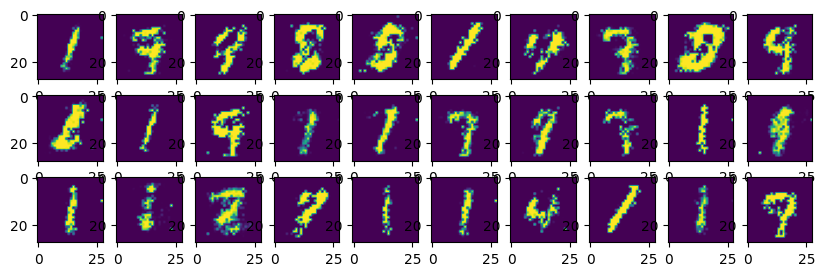

epoch: 29 	 last batch loss D: 0.6032693386077881 	 last batch loss G: 2.228816032409668


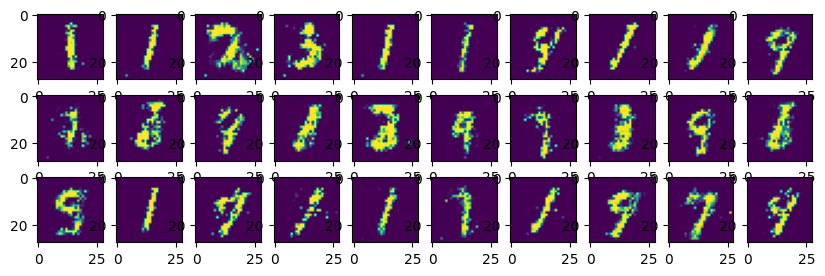

epoch: 30 	 last batch loss D: 0.5372902154922485 	 last batch loss G: 2.527533769607544


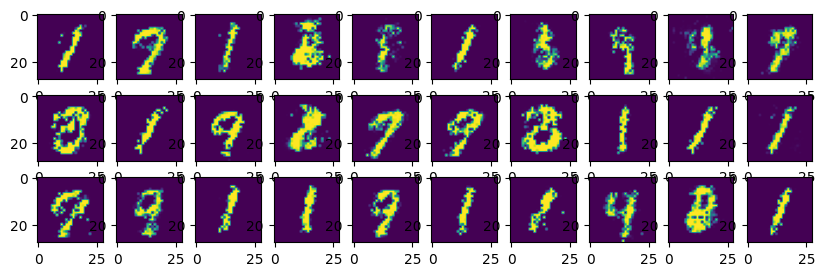

epoch: 31 	 last batch loss D: 0.6918976306915283 	 last batch loss G: 2.159463405609131


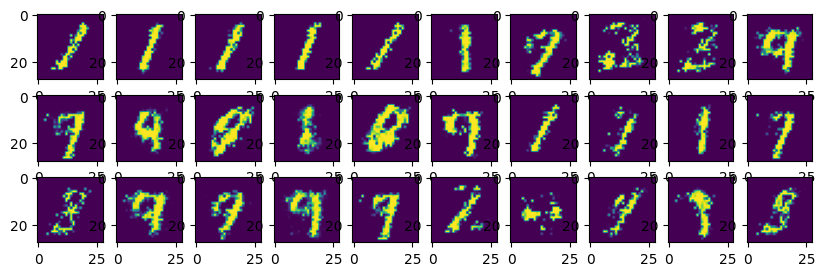

epoch: 32 	 last batch loss D: 0.5620444416999817 	 last batch loss G: 2.0438449382781982


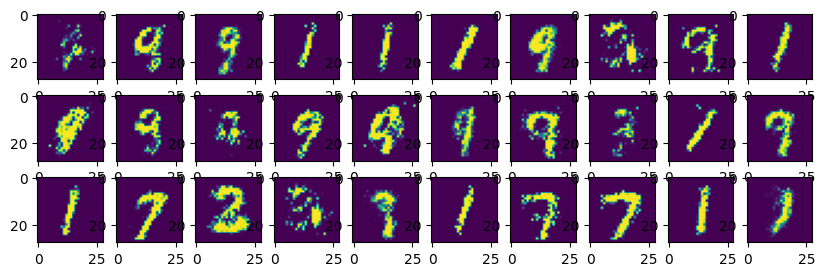

epoch: 33 	 last batch loss D: 0.7465201616287231 	 last batch loss G: 1.895036220550537


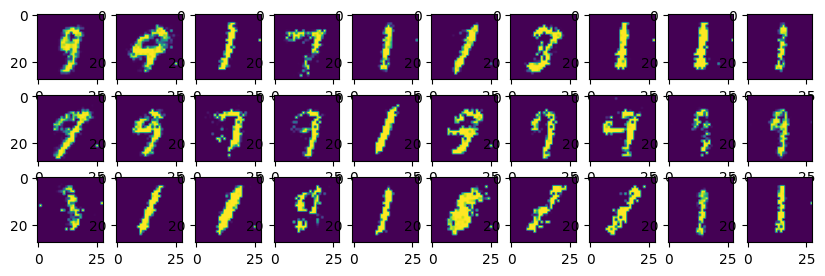

epoch: 34 	 last batch loss D: 0.6530176401138306 	 last batch loss G: 2.006068468093872


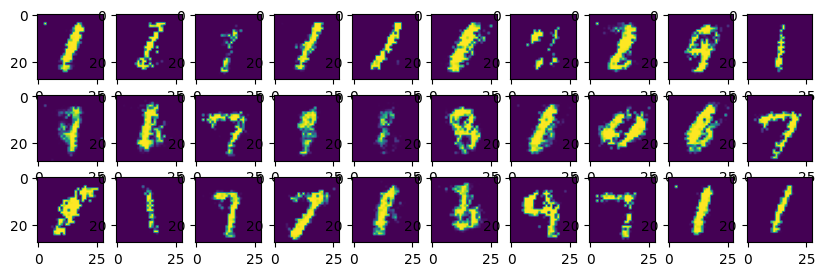

epoch: 35 	 last batch loss D: 0.6632674932479858 	 last batch loss G: 1.927568793296814


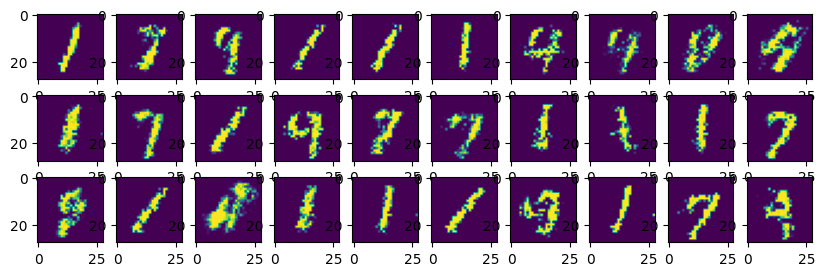

epoch: 36 	 last batch loss D: 0.8515767455101013 	 last batch loss G: 1.9570850133895874


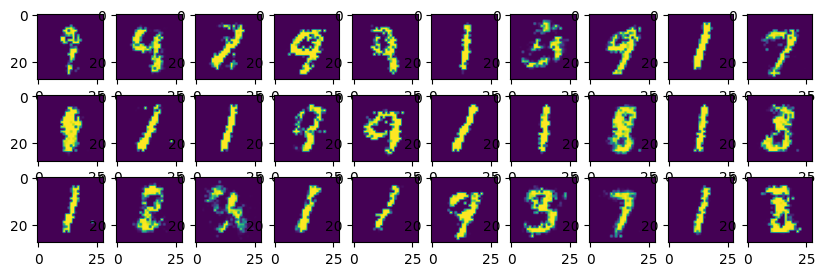

epoch: 37 	 last batch loss D: 0.7828027606010437 	 last batch loss G: 1.7989490032196045


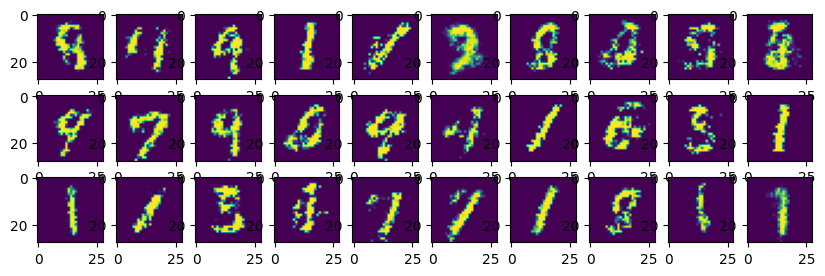

epoch: 38 	 last batch loss D: 0.7423343658447266 	 last batch loss G: 1.5601011514663696


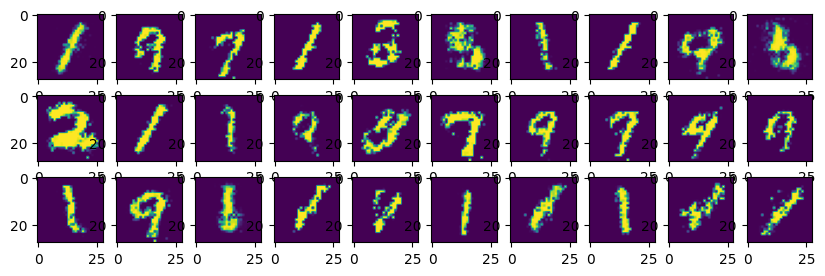

epoch: 39 	 last batch loss D: 0.7894225120544434 	 last batch loss G: 1.639075756072998


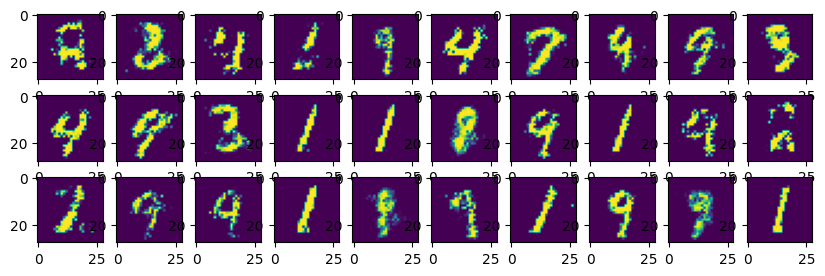

epoch: 40 	 last batch loss D: 0.7595659494400024 	 last batch loss G: 1.5176575183868408


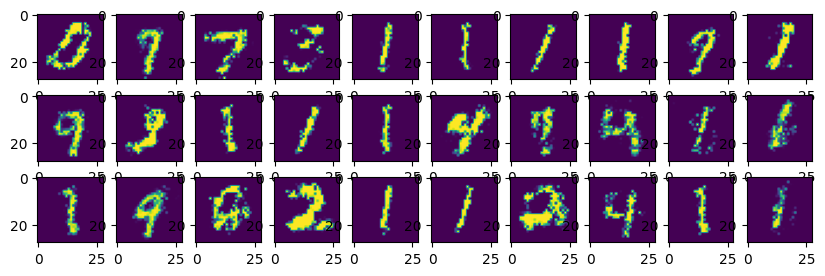

epoch: 41 	 last batch loss D: 0.65076744556427 	 last batch loss G: 1.546959638595581


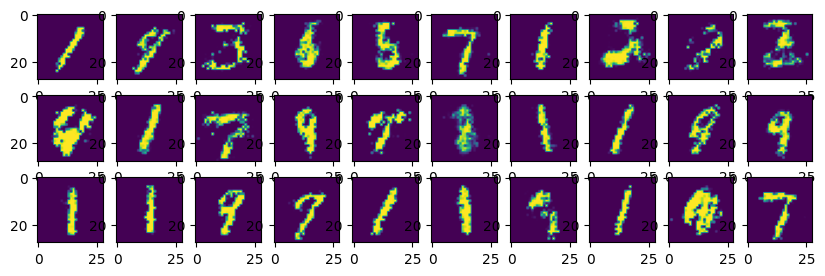

epoch: 42 	 last batch loss D: 0.8061581254005432 	 last batch loss G: 1.4824590682983398


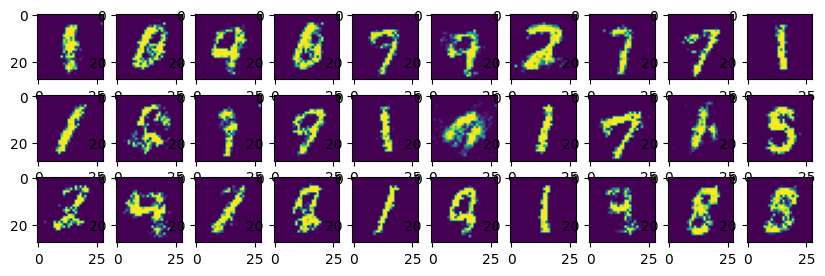

epoch: 43 	 last batch loss D: 0.7095353603363037 	 last batch loss G: 1.6041511297225952


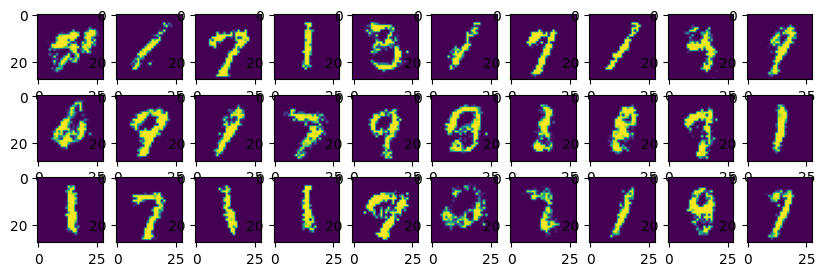

epoch: 44 	 last batch loss D: 0.7483784556388855 	 last batch loss G: 1.390812873840332


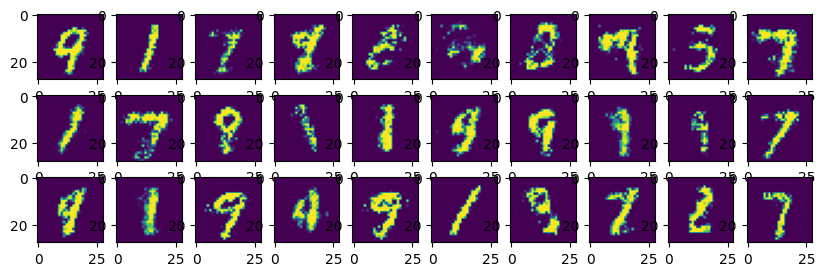

epoch: 45 	 last batch loss D: 0.8516625165939331 	 last batch loss G: 1.5694504976272583


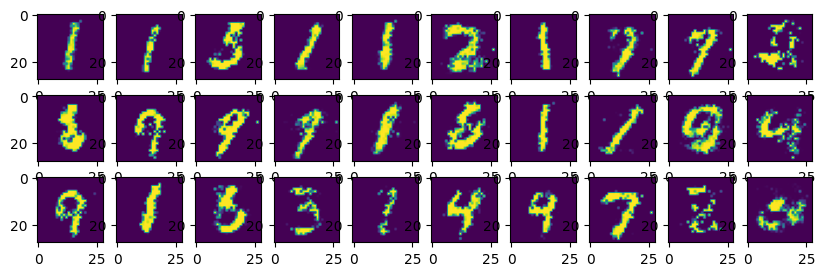

epoch: 46 	 last batch loss D: 0.8903836011886597 	 last batch loss G: 1.546217918395996


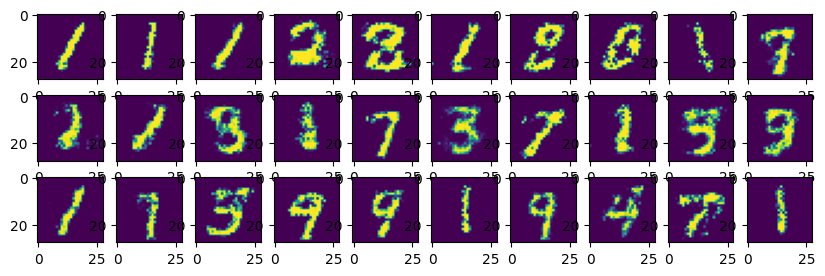

epoch: 47 	 last batch loss D: 0.9697349667549133 	 last batch loss G: 1.4066860675811768


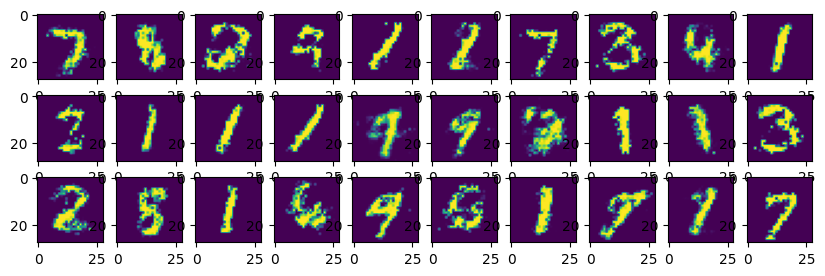

epoch: 48 	 last batch loss D: 0.7963814735412598 	 last batch loss G: 1.4540228843688965


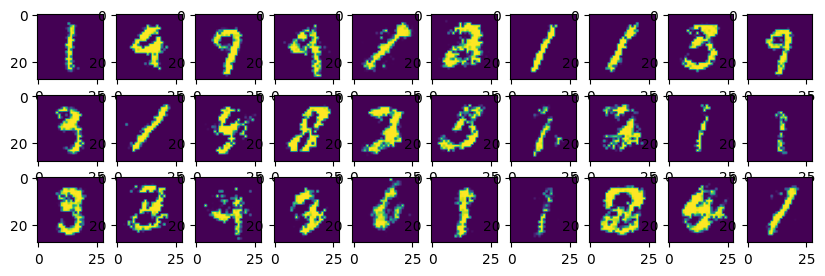

epoch: 49 	 last batch loss D: 0.8064572811126709 	 last batch loss G: 1.4640392065048218


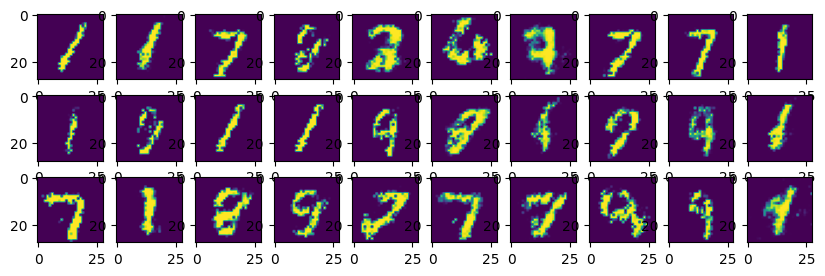

epoch: 50 	 last batch loss D: 0.8478171825408936 	 last batch loss G: 1.4488946199417114


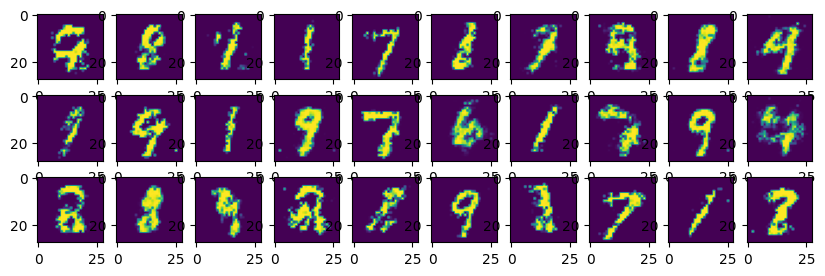

epoch: 51 	 last batch loss D: 0.9122012853622437 	 last batch loss G: 1.6172648668289185


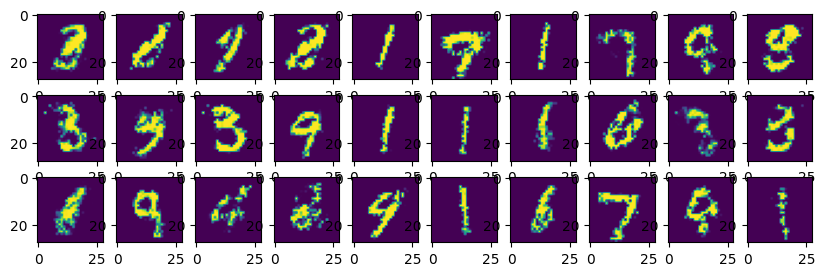

epoch: 52 	 last batch loss D: 0.992411196231842 	 last batch loss G: 1.4111297130584717


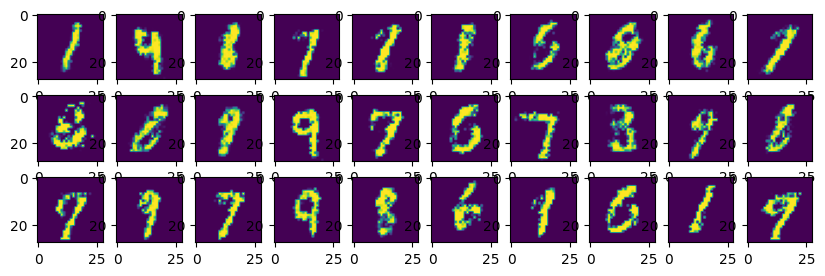

epoch: 53 	 last batch loss D: 0.8874721527099609 	 last batch loss G: 1.4185235500335693


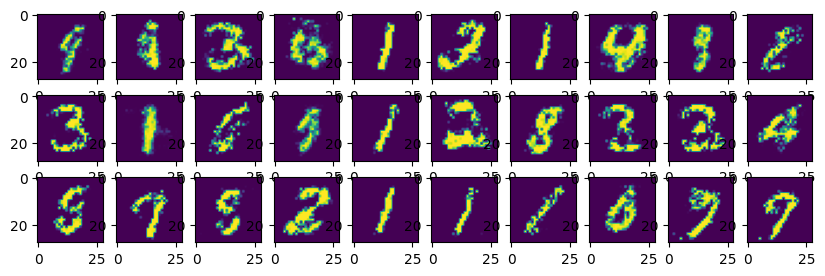

epoch: 54 	 last batch loss D: 1.0392457246780396 	 last batch loss G: 1.4675062894821167


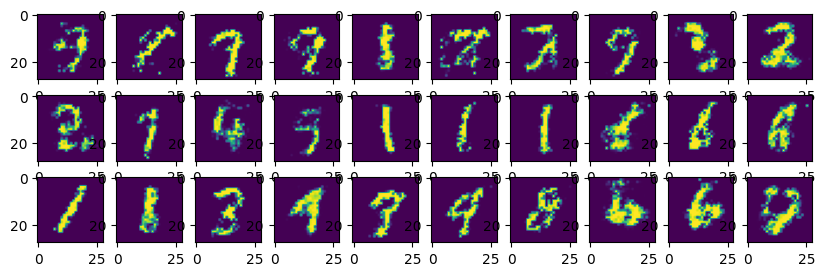

epoch: 55 	 last batch loss D: 1.079973816871643 	 last batch loss G: 1.4735631942749023


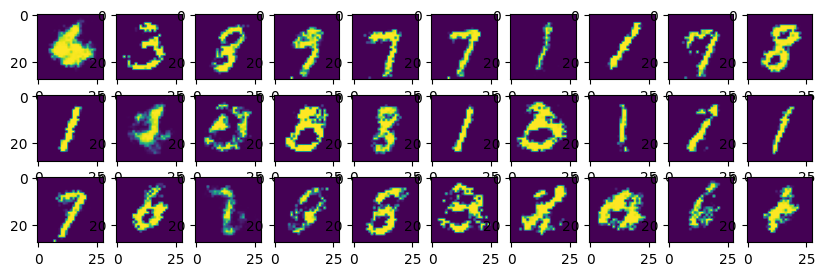

epoch: 56 	 last batch loss D: 0.929010808467865 	 last batch loss G: 1.3412539958953857


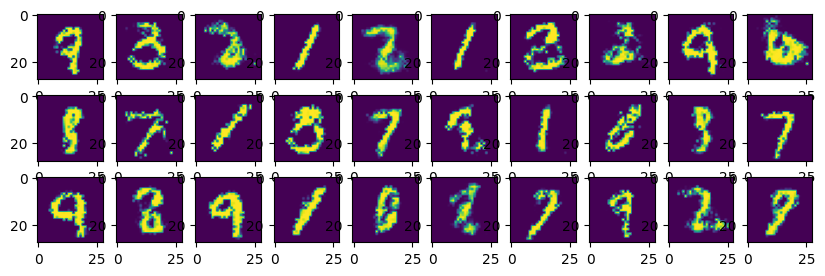

epoch: 57 	 last batch loss D: 0.9079107046127319 	 last batch loss G: 1.2753164768218994


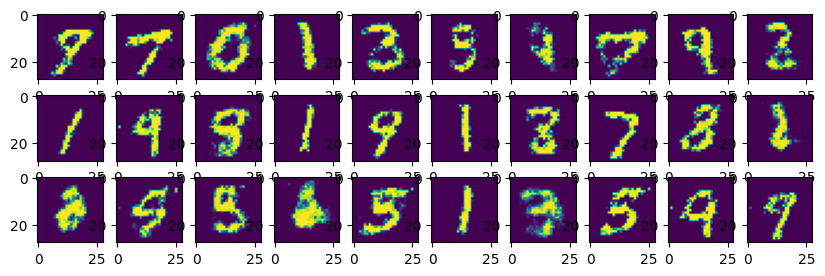

epoch: 58 	 last batch loss D: 0.8965203762054443 	 last batch loss G: 1.288306474685669


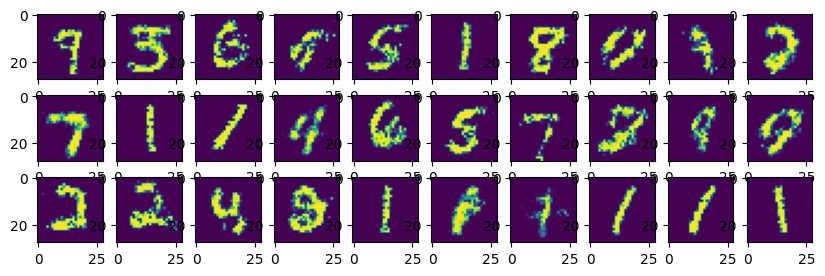

epoch: 59 	 last batch loss D: 1.089536190032959 	 last batch loss G: 1.2975234985351562


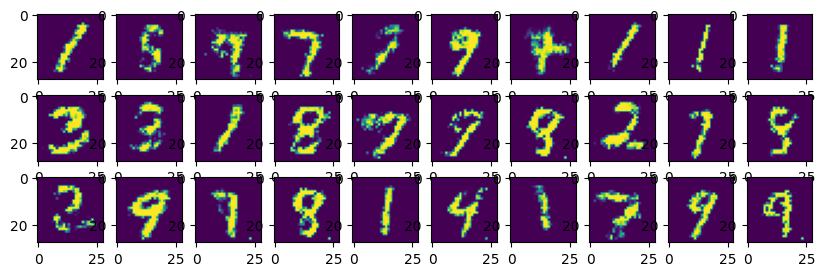

epoch: 60 	 last batch loss D: 1.2208231687545776 	 last batch loss G: 1.1229159832000732


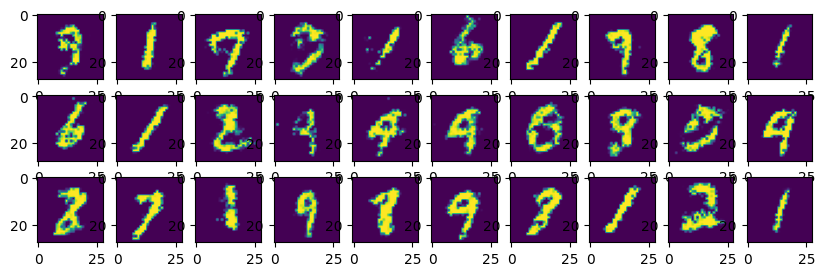

epoch: 61 	 last batch loss D: 0.9737586975097656 	 last batch loss G: 1.311834454536438


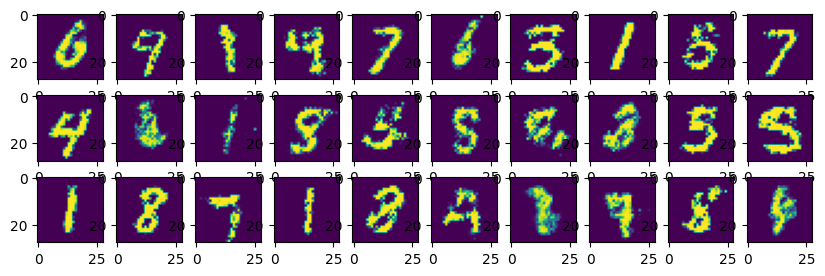

epoch: 62 	 last batch loss D: 1.2039474248886108 	 last batch loss G: 1.248977780342102


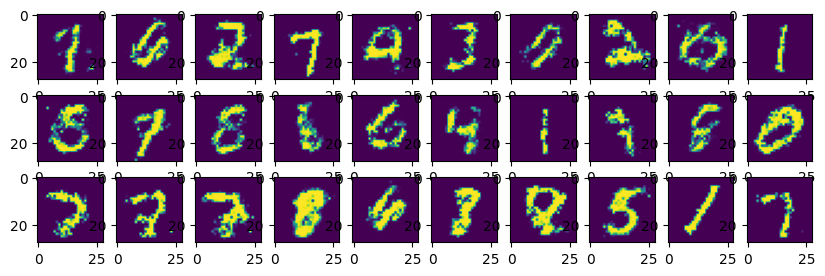

epoch: 63 	 last batch loss D: 1.0134050846099854 	 last batch loss G: 1.2805267572402954


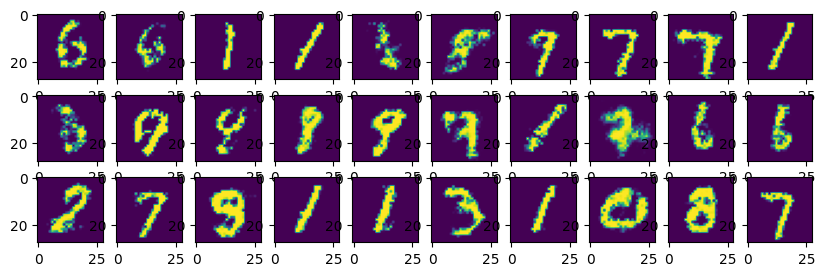

epoch: 64 	 last batch loss D: 1.0276612043380737 	 last batch loss G: 1.3335665464401245


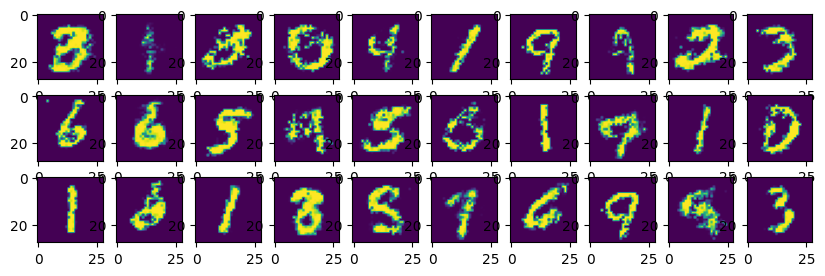

epoch: 65 	 last batch loss D: 1.0994040966033936 	 last batch loss G: 1.1259411573410034


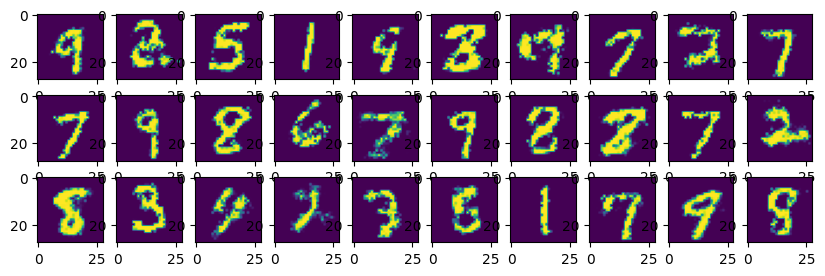

epoch: 66 	 last batch loss D: 1.045407772064209 	 last batch loss G: 1.333152174949646


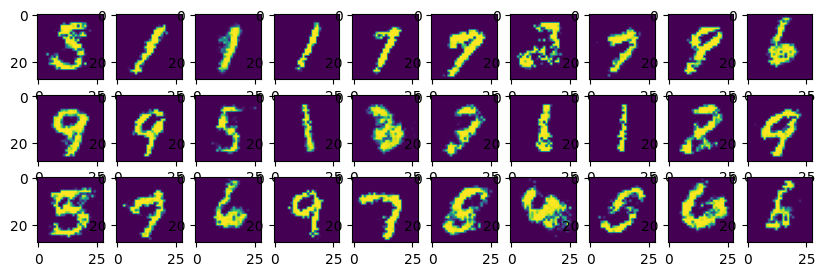

epoch: 67 	 last batch loss D: 0.9932543039321899 	 last batch loss G: 1.0909931659698486


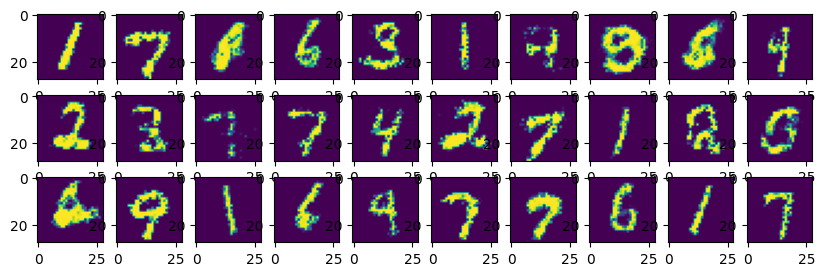

epoch: 68 	 last batch loss D: 0.9533466696739197 	 last batch loss G: 1.2761893272399902


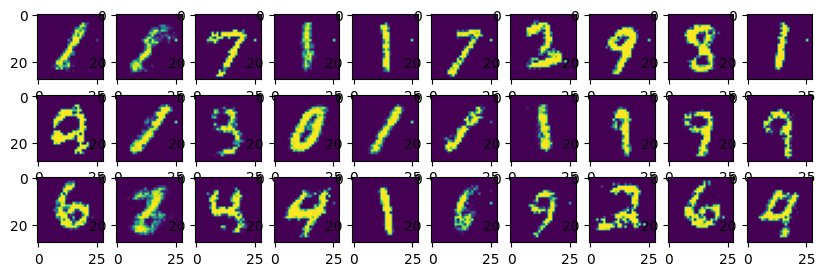

epoch: 69 	 last batch loss D: 1.0937219858169556 	 last batch loss G: 1.076890230178833


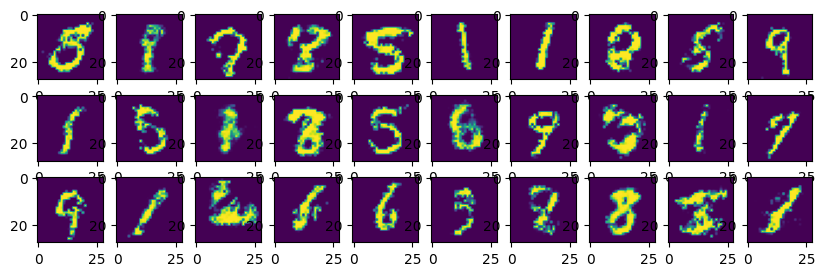

epoch: 70 	 last batch loss D: 1.069197416305542 	 last batch loss G: 1.0481865406036377


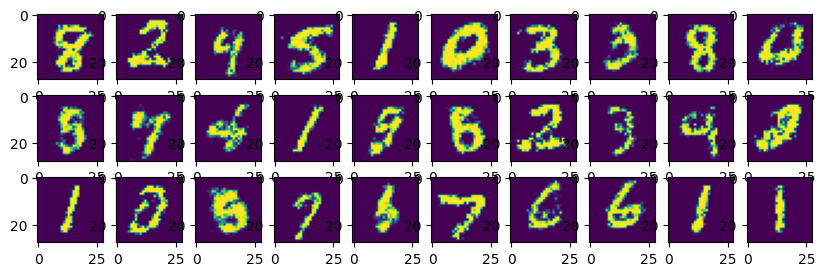

epoch: 71 	 last batch loss D: 1.1433855295181274 	 last batch loss G: 1.208451747894287


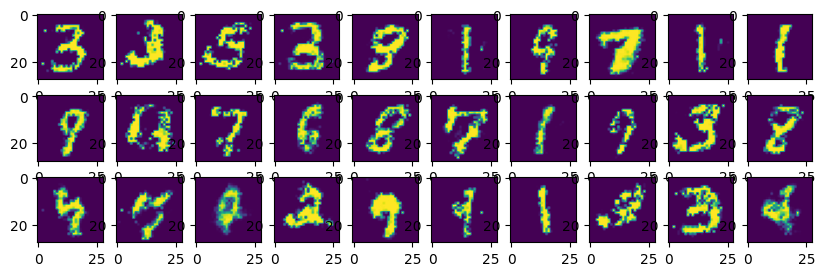

epoch: 72 	 last batch loss D: 0.9301064014434814 	 last batch loss G: 1.1932183504104614


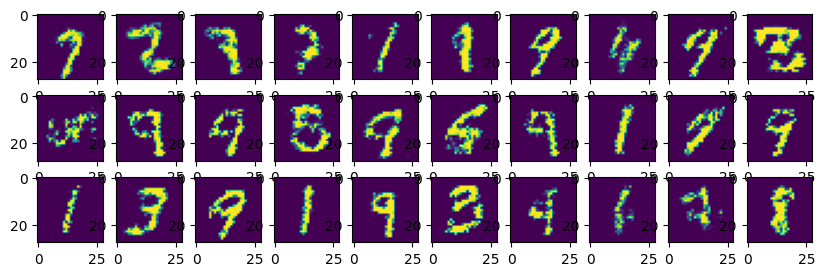

epoch: 73 	 last batch loss D: 1.1211819648742676 	 last batch loss G: 1.0115504264831543


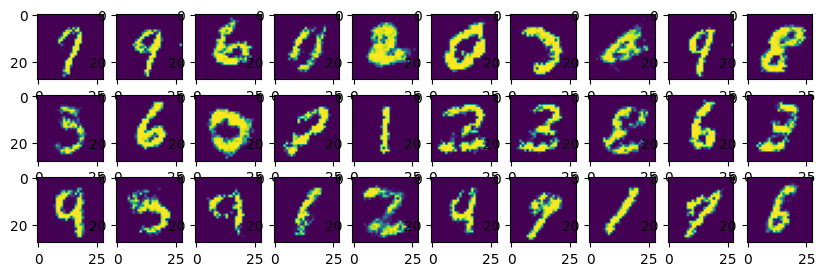

epoch: 74 	 last batch loss D: 1.0544382333755493 	 last batch loss G: 1.0790635347366333


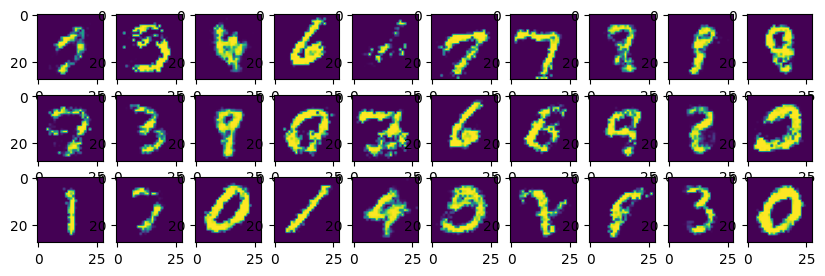

epoch: 75 	 last batch loss D: 0.9443138837814331 	 last batch loss G: 1.1958234310150146


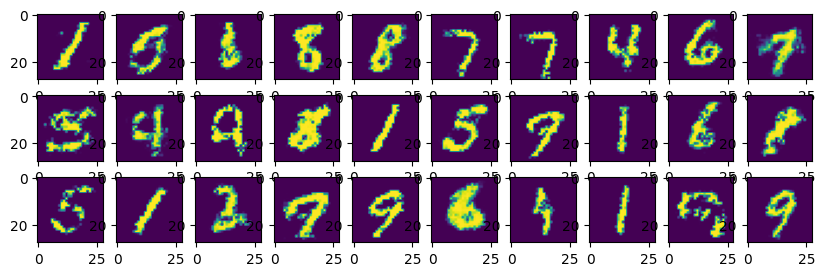

epoch: 76 	 last batch loss D: 1.1905180215835571 	 last batch loss G: 1.111369252204895


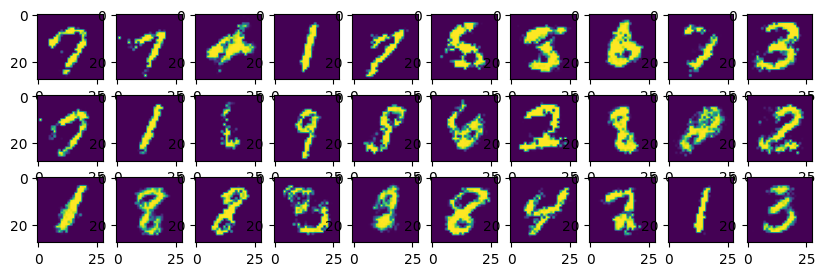

epoch: 77 	 last batch loss D: 1.0802898406982422 	 last batch loss G: 1.0326924324035645


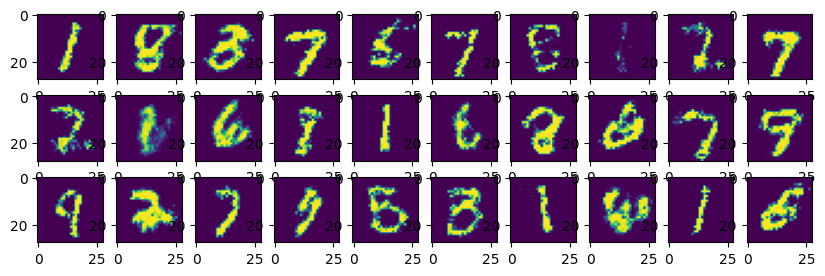

epoch: 78 	 last batch loss D: 1.0914921760559082 	 last batch loss G: 1.2574305534362793


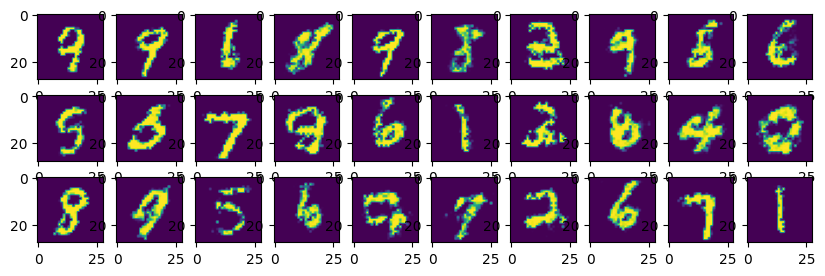

epoch: 79 	 last batch loss D: 1.166452407836914 	 last batch loss G: 1.0945478677749634


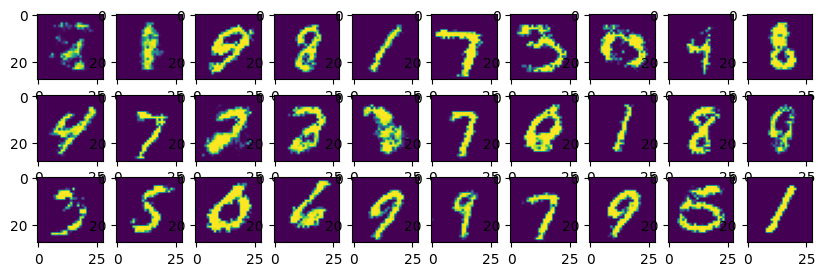

epoch: 80 	 last batch loss D: 1.0908246040344238 	 last batch loss G: 1.0705983638763428


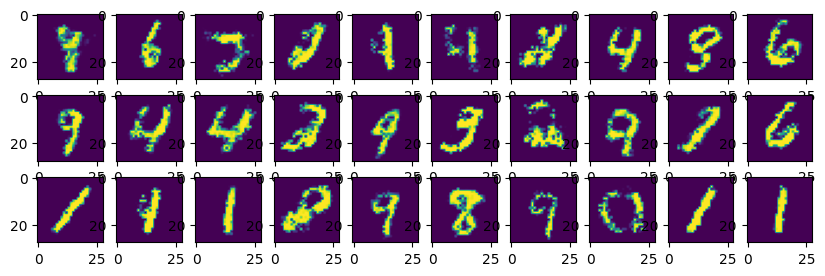

epoch: 81 	 last batch loss D: 1.084040880203247 	 last batch loss G: 1.099740982055664


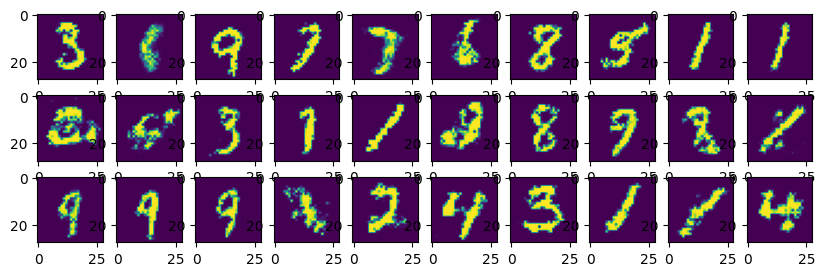

epoch: 82 	 last batch loss D: 1.1611573696136475 	 last batch loss G: 0.982758104801178


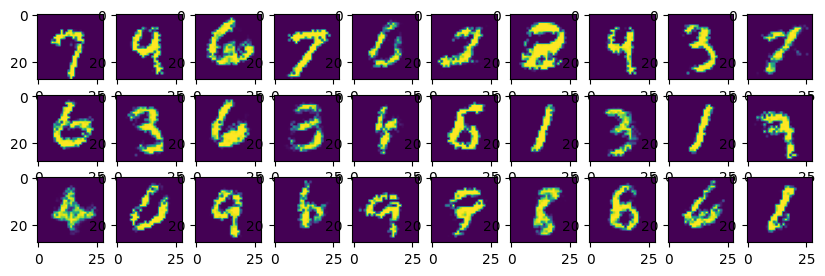

epoch: 83 	 last batch loss D: 1.0693531036376953 	 last batch loss G: 1.0874180793762207


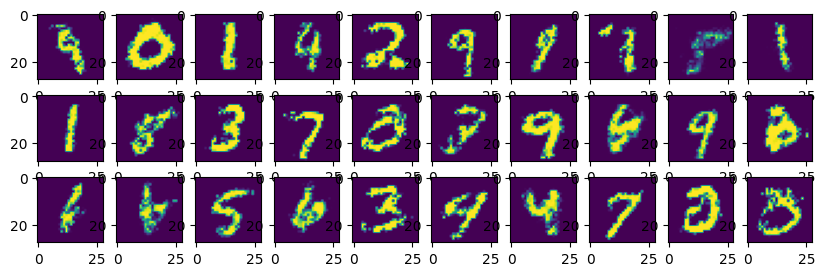

epoch: 84 	 last batch loss D: 1.1018736362457275 	 last batch loss G: 1.0476312637329102


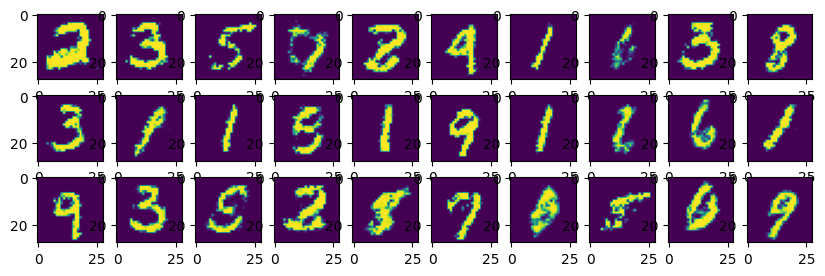

epoch: 85 	 last batch loss D: 1.159362554550171 	 last batch loss G: 0.9831708669662476


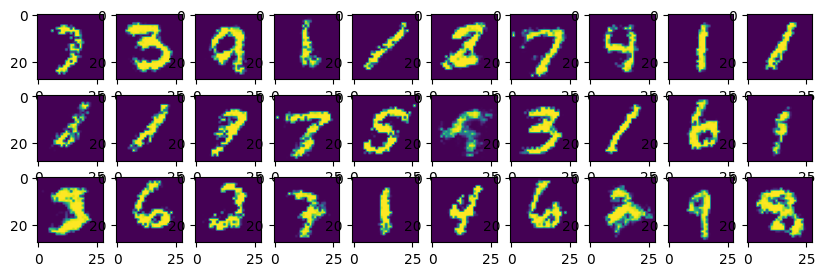

epoch: 86 	 last batch loss D: 1.043839931488037 	 last batch loss G: 1.2020237445831299


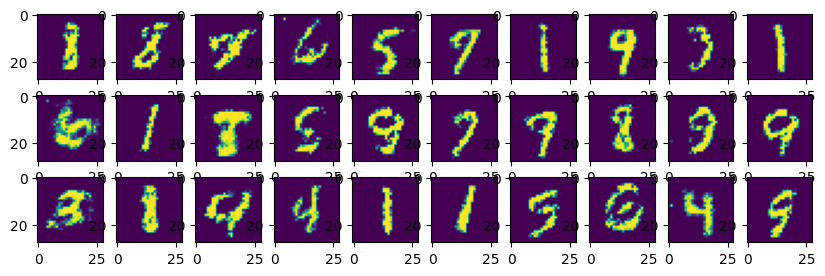

epoch: 87 	 last batch loss D: 1.1177010536193848 	 last batch loss G: 1.101149320602417


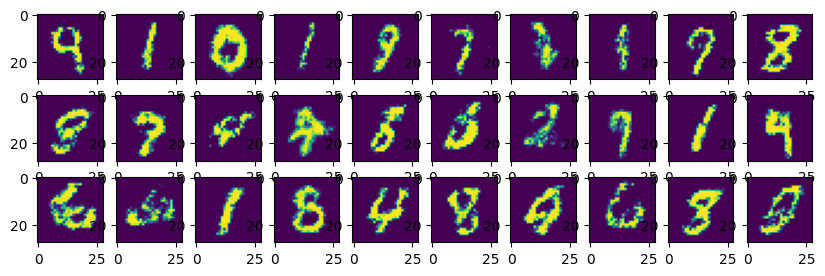

epoch: 88 	 last batch loss D: 1.1777324676513672 	 last batch loss G: 1.1139646768569946


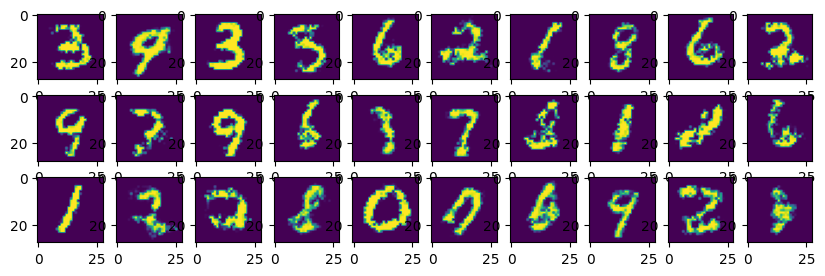

epoch: 89 	 last batch loss D: 1.192939281463623 	 last batch loss G: 1.0604631900787354


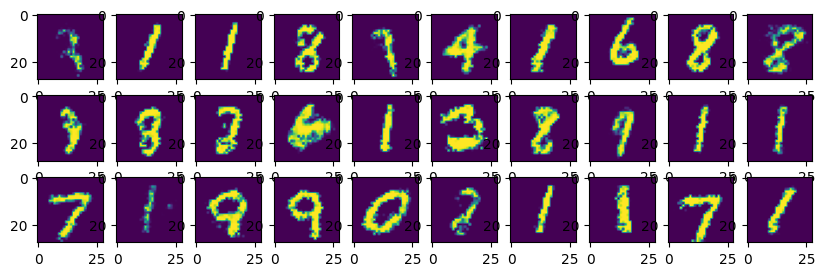

epoch: 90 	 last batch loss D: 1.078385591506958 	 last batch loss G: 1.1856849193572998


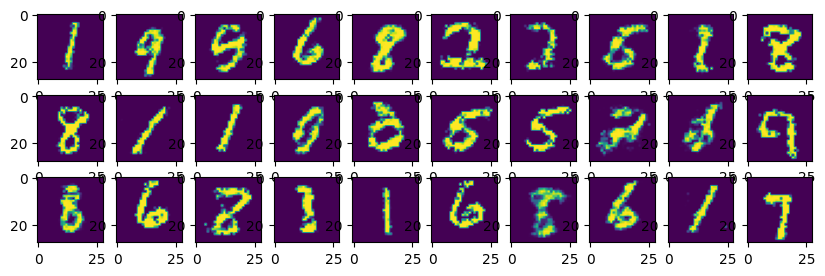

epoch: 91 	 last batch loss D: 1.1441997289657593 	 last batch loss G: 1.1352970600128174


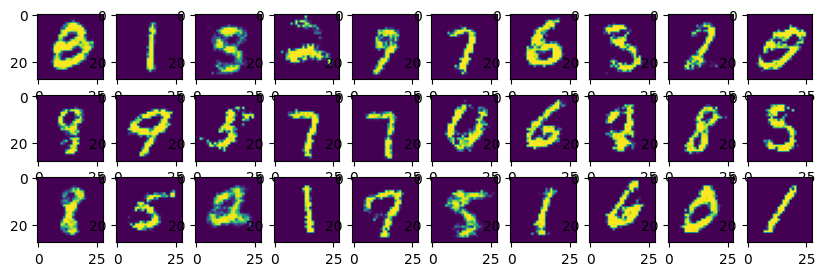

epoch: 92 	 last batch loss D: 1.1871464252471924 	 last batch loss G: 1.153771996498108


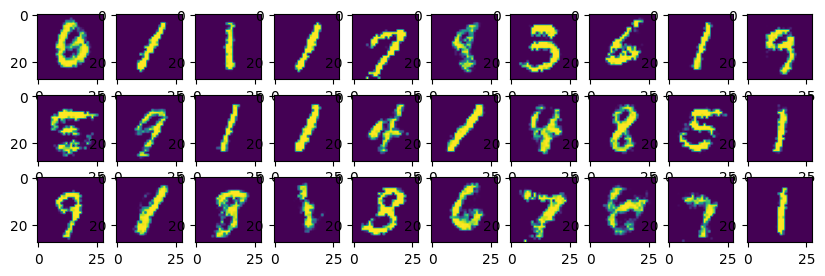

epoch: 93 	 last batch loss D: 1.2092061042785645 	 last batch loss G: 1.1376328468322754


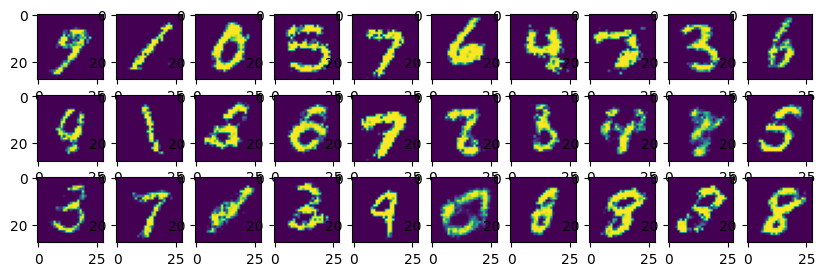

epoch: 94 	 last batch loss D: 1.0783660411834717 	 last batch loss G: 0.999439001083374


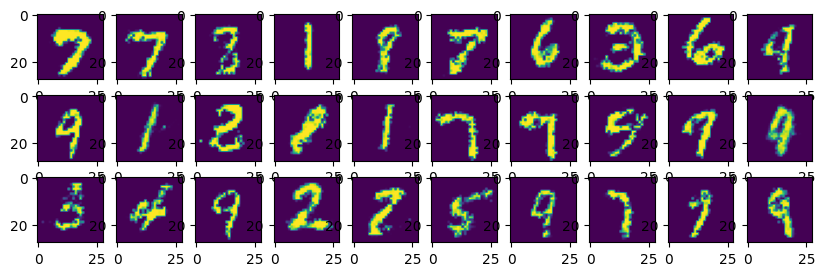

epoch: 95 	 last batch loss D: 1.0975008010864258 	 last batch loss G: 1.0240869522094727


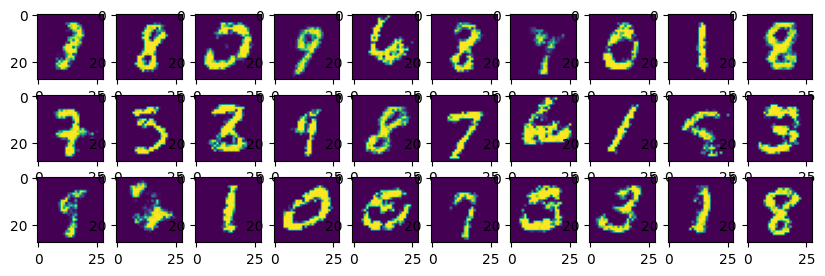

epoch: 96 	 last batch loss D: 1.1964406967163086 	 last batch loss G: 1.0491524934768677


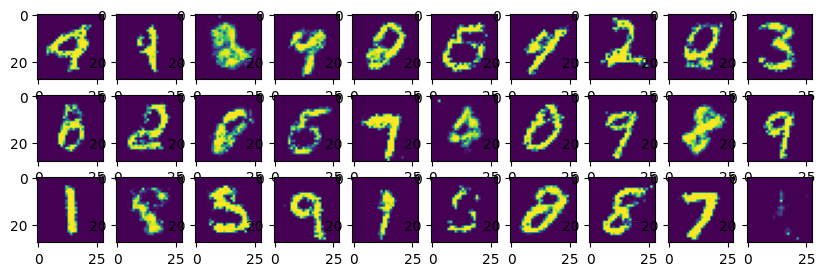

epoch: 97 	 last batch loss D: 1.1797958612442017 	 last batch loss G: 0.9505537152290344


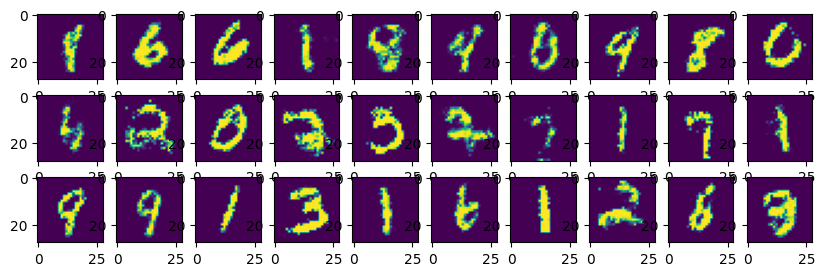

epoch: 98 	 last batch loss D: 1.1022229194641113 	 last batch loss G: 1.2293168306350708


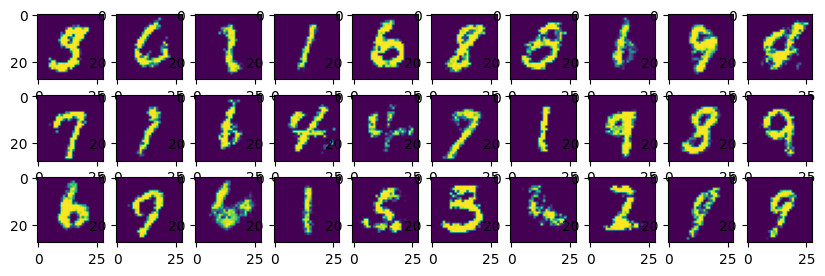

epoch: 99 	 last batch loss D: 1.1275451183319092 	 last batch loss G: 0.9641233682632446


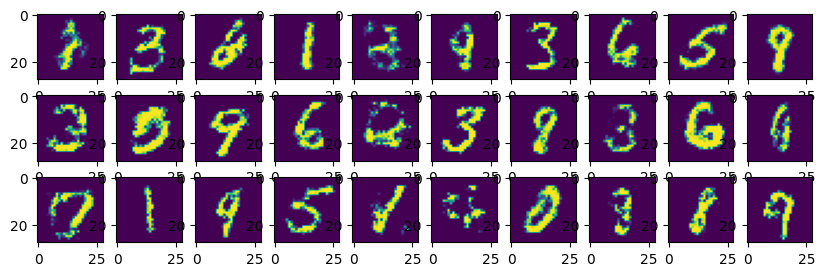

In [23]:
# [CHANGED] EPSILON is not needed anymore
# EPSILON = 1e-6

for epoch in range(N_EPOCH):
    for i, (img, label) in enumerate(loader_train):
        img = img.flatten(start_dim=1)

        real_img = img
        real_img = real_img.to(device)

        fake_labels = torch.zeros(img.shape[0], 1).to(device)
        real_labels = torch.ones(img.shape[0], 1).to(device)

        #########################
        z = (r1 - r2) * torch.rand(img.shape[0], 128)+ r2
        z = z.to(device)
        fake_img = generator(z)

        opt_D.zero_grad()
        # [CHANGED] BCE is more stable
        #         loss_d = -(torch.log(EPSILON + 1 - discriminator(fake_img.detach())) + 
        #                    torch.log(EPSILON + discriminator(real_img))).mean()
        loss_d = (F.binary_cross_entropy(discriminator(fake_img.detach()), fake_labels) +
                  F.binary_cross_entropy(discriminator(real_img), real_labels))
        loss_d.backward()
        opt_D.step()
        #########################
        # z = torch.randn(img.shape[0], 128)
        z = (r1 - r2) * torch.rand(img.shape[0], 128)+ r2
        z = z.to(device)
        
        fake_img = generator(z)

        opt_G.zero_grad()
        # [CHANGED] BCE is more stable
        #     loss_g = - torch.log(EPSILON + discriminator(fake_img)).mean()
        loss_g = F.binary_cross_entropy(discriminator(fake_img), real_labels)
        loss_g.backward()
        opt_G.step()
        #########################

    
    print("epoch: {} \t last batch loss D: {} \t last batch loss G: {}".format(epoch, loss_d.item(), loss_g.item()))

    # [CHANGED] Better output
    for i in range(3):
        for j in range(10):
            plt.subplot(3, 10, i * 10 + j + 1)
            plt.imshow(fake_img[i * 10 + j].detach().cpu().view(28, 28).numpy())
    plt.show()


In [33]:
# save the model
weight_file = os.path.join(save_dir,'generator_1')
torch.save(generator.state_dict(), weight_file)

weight_file = os.path.join(save_dir,'discriminator_1')
torch.save(discriminator.state_dict(), weight_file)


# load the model
weight_file = os.path.join(save_dir,'generator_1')
generator.load_state_dict(torch.load(weight_file,map_location=device))

<All keys matched successfully>

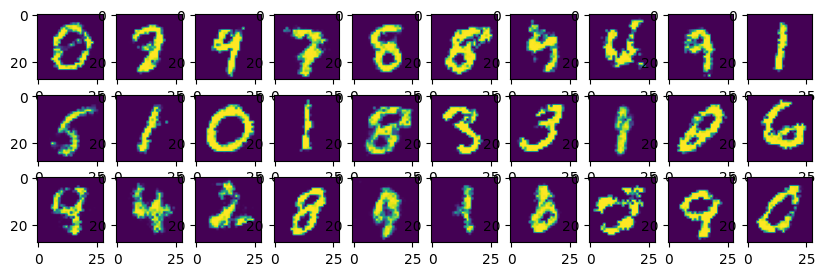

In [30]:
z = (r1 - r2) * torch.rand(img.shape[0], 128)+ r2
z = z.to(device)
fake_img = generator(z)


for i in range(3):
    for j in range(10):
        plt.subplot(3, 10, i * 10 + j + 1)
        plt.imshow(fake_img[i * 10 + j].detach().cpu().view(28, 28).numpy())